In [1]:
import os
os.chdir('C:\\Users\\leobu\\Documents\\GitHub\\CL24\\scripts')
from pprint import pprint
import networkx as nx
import matplotlib.pyplot as plt

from data import get_pots
from graph_utils import initialize_edges
from matching_tests import matching_existence_distinct_pots, matching_existence_within_pots, is_matching_distinct_pots, is_matching_within_pot

from graph_utils import single_pot_graph, transformed_graph, reconstitute_matching
from edmonds.blossom import matching_edmonds

# Set display parameters
plt.rcParams["figure.figsize"] = (15,15)
plt.rcParams["axes.titlesize"] = 70

In [43]:
import requests
from bs4 import BeautifulSoup

url = "https://www.uefa.com/nationalassociations/uefarankings/club/#/yr/2024"  # Replace with the actual URL

# Make a GET request to the URL("span")
response = requests.get(url)

# Parse the HTML content using BeautifulSoup
soup = BeautifulSoup(response.text)
teams = soup.select(':nth-child(1)')
print(teams)


[<html><head>
<title>Access Denied</title>
</head><body>
<h1>Access Denied</h1>
 
You don't have permission to access "http://www.uefa.com/nationalassociations/uefarankings/club/" on this server.<p>
Reference #18.d5745968.1703441038.2c7c312e
</p></body>
</html>, <head>
<title>Access Denied</title>
</head>, <title>Access Denied</title>, <h1>Access Denied</h1>]


# Data Retrieval

During the UEFA Champions League 2024, UEFA aims to
distribute the top 36 teams into 4 pots and create a
match schedule where each team faces 2 teams from
each pot, with the condition that two teams from the
same country cannot compete against each other.

UEFA ranking of the top 36 teams. The teams are distributed into 4 groups.

In [5]:
pots = get_pots()
pprint(pots)

{'A': [{'club': 'Manchester City', 'country': 'Eng'},
       {'club': 'Bayern München', 'country': 'Ger'},
       {'club': 'Chelsea', 'country': 'Eng'},
       {'club': 'Liverpool', 'country': 'Eng'},
       {'club': 'Real Madrid', 'country': 'Esp'},
       {'club': 'Paris Saint-Germain', 'country': 'Fra'},
       {'club': 'Manchester United', 'country': 'Eng'},
       {'club': 'Juventus', 'country': 'Ita'},
       {'club': 'FC Barcelona', 'country': 'Esp'}],
 'B': [{'club': 'AS Roma', 'country': 'Ita'},
       {'club': 'Internazionale', 'country': 'Ita'},
       {'club': 'Sevilla', 'country': 'Esp'},
       {'club': 'Ajax', 'country': 'Ned'},
       {'club': 'Borussia Dortmund', 'country': 'Ger'},
       {'club': 'Atlético Madrid', 'country': 'Esp'},
       {'club': 'RB Leipzig', 'country': 'Ger'},
       {'club': 'Benfica', 'country': 'Por'},
       {'club': 'Villarreal', 'country': 'Esp'}],
 'C': [{'club': 'Napoli', 'country': 'Ita'},
       {'club': 'FC Porto', 'country': 'Por'},
 

# General Problem

We are given a graph $G=(V,E)$, where the vertices are partitioned into $k$ subsets $V_1, \dots, V_k$. An integer $d$ is given. The goal is to decide whether there exists a subset $F$ of $E$ such that every vertex has $d$ neighbors in $F$ within each $V_i$.

We show the application for UEFA Champions League ($k=4$ and $d=2$).

## Problem as a Graph

In [6]:
# Create a Graph
G = nx.Graph()

# Add nodes to the graph for each team
G.add_nodes_from([team['club'] for pot in pots.values() for team in pot])

# Add edges between pots with the condition that the teams are from different countries
for i, pot_i in enumerate(pots.values()):
  for j, pot_j in enumerate(pots.values()):
    if i != j:
      G.add_edges_from(initialize_edges(pot_i, pot_j))

# Set the positions of the nodes in the graph
pos = {team['club']: (6 + 6 * i, j % 9 + 2) for i, pot in enumerate(pots.values()) for j, team in enumerate(pot)}

# Set the options for the visualization of the graph
options = {
  "font_size": 50,
  "font_color": "orangered",
  "node_size": 100,
  "edge_color" : "limegreen",
  "node_color": "darkorange",
  "edgecolors": "darkorange",
  "linewidths": 3,
  "width": 2,
}

## The 4 groups of the Champions League

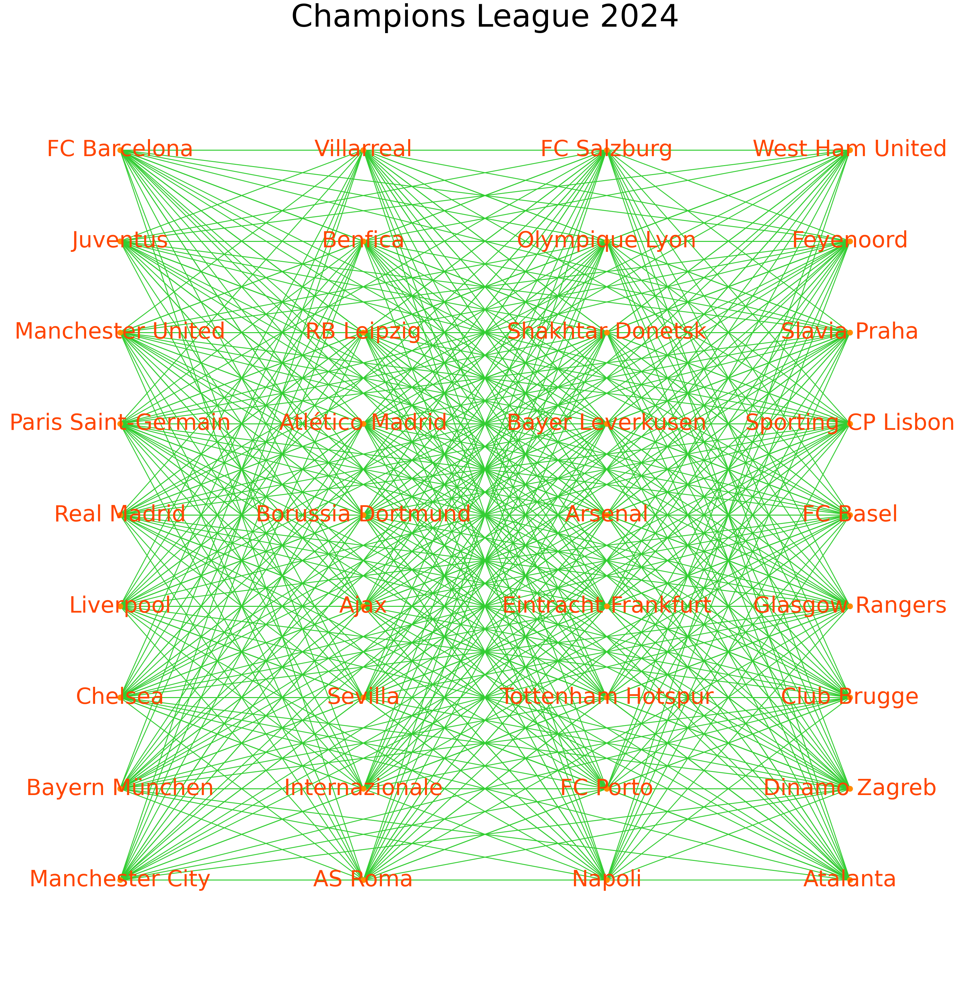

In [7]:
plt.figure(figsize=(30,30))
nx.draw(G, pos = pos, with_labels = True, **options)
ax = plt.gca()
plt.title('Champions League 2024', pad = 10)
#plt.savefig('Champions_leagues_pots.png', transparent=True)
ax.margins(0.1)
plt.axis("off")
plt.show()

# First Problem: Existence Algorithm of d-matching in a Bipartite Graph

For each distinct pair of integers $i,\, j \in [\![0, k]\!]$:
decide if there exists a subset of edges in the bipartite graph $(V_i \cup V_j , E_{ij} )$ giving each vertex a degree d, where $E_{ij}$ is the subset
of E with one end in $V_i$ and one end in $V_j$. This is done in polynomial time by a "flow algorithm".

**Input:** $G = (U \cup V, E)$ bipartite graph, $d$

**Output:** Find a subset $F ⊆ E$ such that $\forall v \in V \, deg_F (v) = d.$

## Example

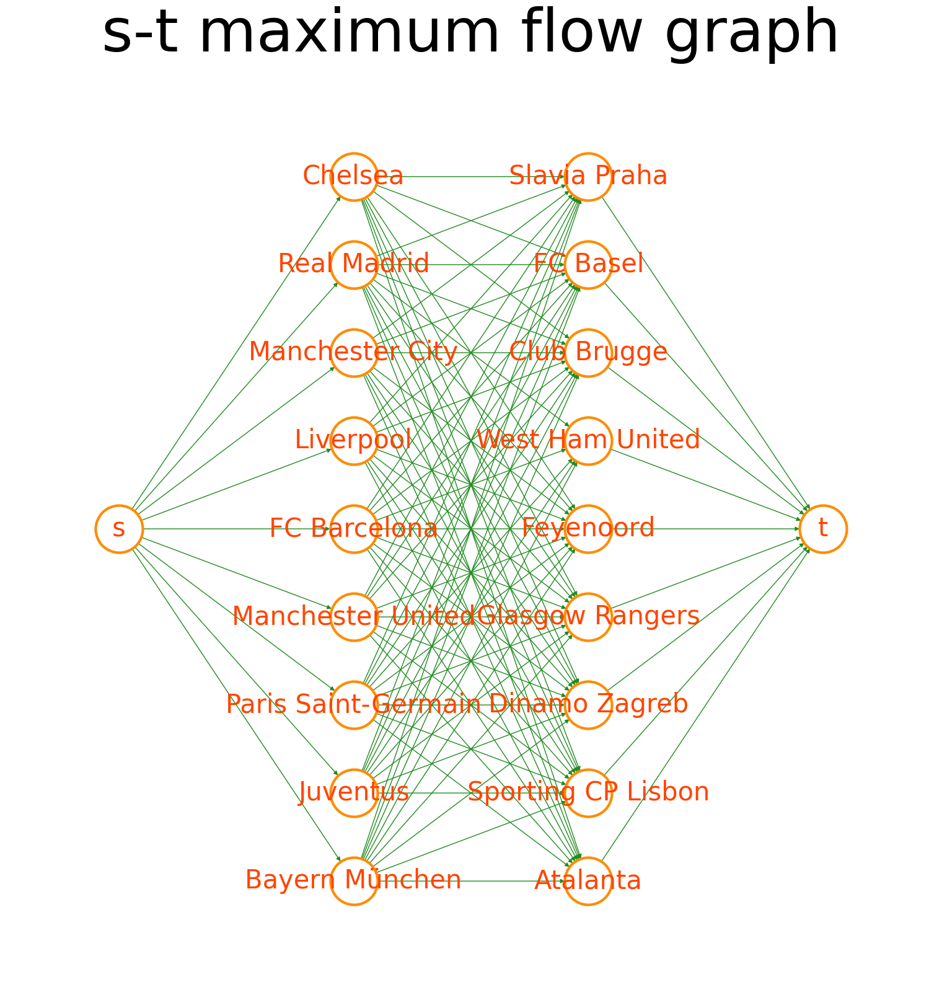

A subset F has been found such that ∀v ∈ V degF (v) = 2.
Resulting graph with charged edges




[('Bayern München', 'Dinamo Zagreb'), ('Bayern München', 'West Ham United'), ('Juventus', 'Dinamo Zagreb'), ('Juventus', 'Club Brugge'), ('Paris Saint-Germain', 'Atalanta'), ('Paris Saint-Germain', 'Club Brugge'), ('Manchester United', 'Glasgow Rangers'), ('Manchester United', 'FC Basel'), ('FC Barcelona', 'Glasgow Rangers'), ('FC Barcelona', 'FC Basel'), ('Liverpool', 'Sporting CP Lisbon'), ('Liverpool', 'Slavia Praha'), ('Manchester City', 'Sporting CP Lisbon'), ('Manchester City', 'Slavia Praha'), ('Real Madrid', 'Feyenoord'), ('Real Madrid', 'West Ham United'), ('Chelsea', 'Atalanta'), ('Chelsea', 'Feyenoord')]




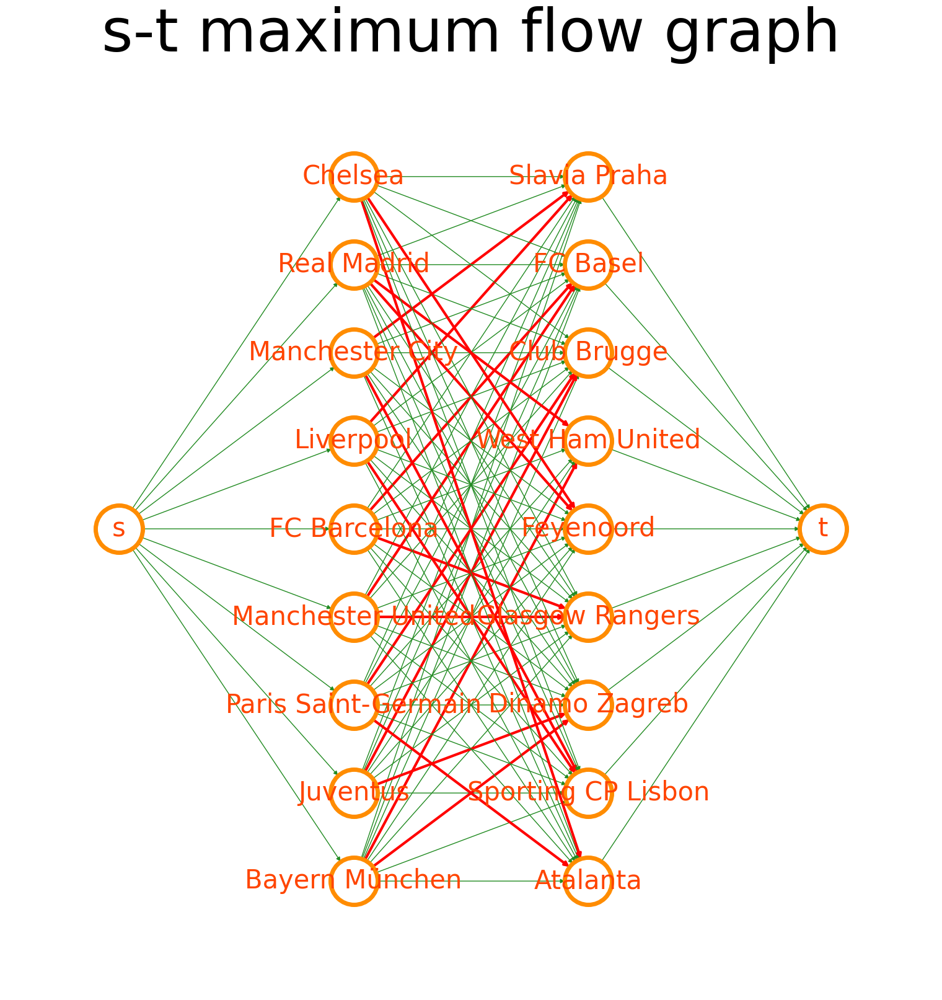

A possible matching is: 
Bayern München - Dinamo Zagreb
Bayern München - West Ham United
Juventus - Dinamo Zagreb
Juventus - Club Brugge
Paris Saint-Germain - Atalanta
Paris Saint-Germain - Club Brugge
Manchester United - Glasgow Rangers
Manchester United - FC Basel
FC Barcelona - Glasgow Rangers
FC Barcelona - FC Basel
Liverpool - Sporting CP Lisbon
Liverpool - Slavia Praha
Manchester City - Sporting CP Lisbon
Manchester City - Slavia Praha
Real Madrid - Feyenoord
Real Madrid - West Ham United
Chelsea - Atalanta
Chelsea - Feyenoord


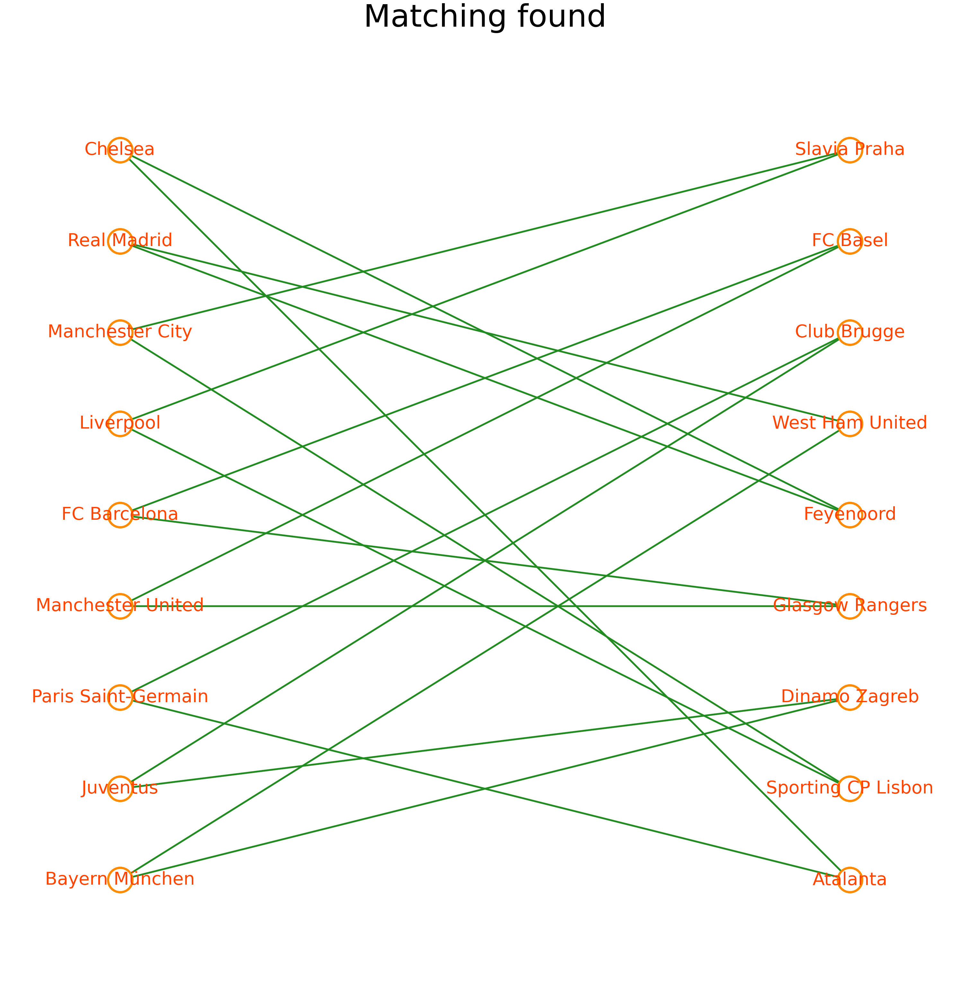

True

In [8]:
is_matching_distinct_pots(pots['A'], pots['D'], degree=2, show = True)

## Results

In [9]:
# Test the function with the given input
matching_existence_distinct_pots(pots, degree=2)

There exist a matching such ∀i!=j ∈ [1,..., k] ∀v ∈ (V_i U V_j) degF (v) = 2 .


True

# Second Problem: Existence Algorithm of d-matching in **Any Graph**

For each integer  $i \in [\![0, k]\!]$ : decide if there exists a subset of edges in the "induced" subgraph $G[V_i] = (V_i, E_i)$ giving each vertex a degree d, where $E_i$ is the subset of E with both ends in $V_i$. This is done in polynomial time by a "simple d-matchings" algorithm. This is a difficult algorithm.

**Input:** $G = (V, E)$, $d \in N$

**Output:** Find a simple d-matching.

## Case $d = 1$

Existence of a perfect matching in any graph.

In the case of $d = 1$, the problem is to find a perfect matching in a graph. Edmonds' algorithm for matchings (also known as the blossom algorithm in English), also known as the flowers and petals algorithm, is an algorithm for constructing maximum matchings on graphs. The algorithm has a time complexity of $O(|E||V|^2)$.

edmonds algorithm : https://github.com/adharshkamath/Edmonds-Algorithm

### Example of a maximal matching in a graph

Resultant Graph with Matched edges 




[[3, 4], [2, 6], [1, 5]]




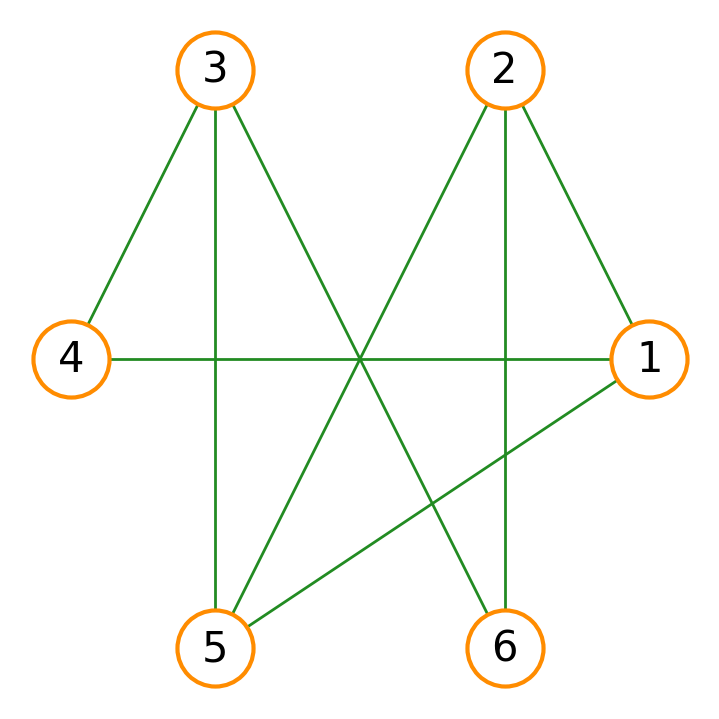

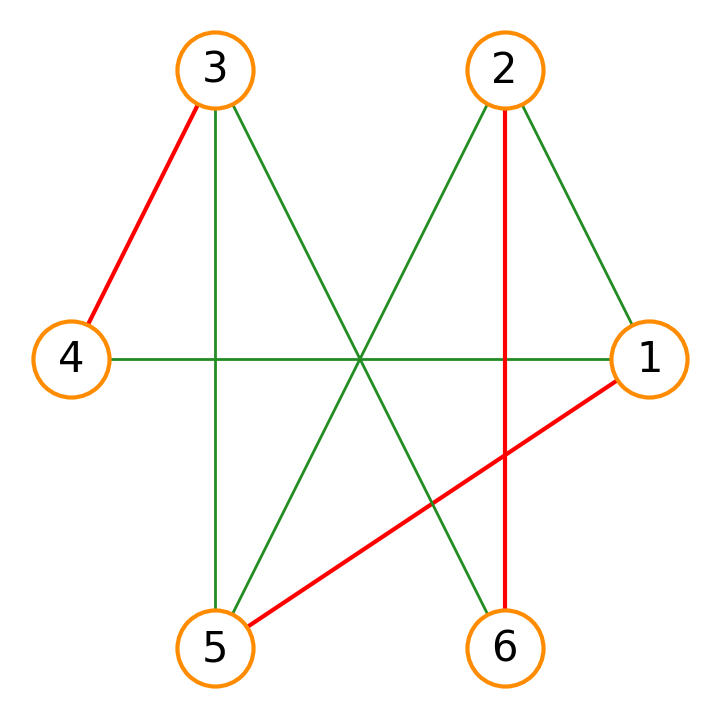

In [10]:
# Illustration of the edmond's algorithme in a random graphe
G_test = nx.Graph()
nodes_= [1,2,3,4,5,6]
edges_ = [(1,2), (1,4), (1,5), (2,5), (2,6), (3,4), (3,5), (3,6)]
G_test.add_nodes_from(nodes_)
G_test.add_edges_from(edges_)
options_ = {
    "font_size": 30,
    "font_color": "black",
    "node_size": 3000,
    "node_color": "white",
    "edgecolors": "darkorange",
    "edge_color": "forestgreen",
    "linewidths": 3,
    "width" : 2
  }

options = {
    "font_size": 30,
    "font_color": "black",
    "node_size": 3000,
    "node_color": "white",
    "edgecolors": "darkorange",
    "linewidths": 3,
  }
plt.figure(figsize=(7,7))
pos = nx.circular_layout(G_test)
nx.draw(G_test, pos, with_labels = True, **options_)


G_test_dash, matching_test = matching_edmonds(G_test, show = True, options = options, figsize = (7,7), pos= pos)

## Case of Any Integer $d$

### Construction of a New Graph


Consider the graph constructed from $G=(V,E)$ as follows:
- Replace each vertex $u$ by $d$ copies $u_1, \dots, u_d$.
- For each edge $(u,v)$ (which is removed), create two vertices $u'$ and $v'$ connected by an edge, add $d$ edges between the $u_i$'s and $u'$, add $d$ edges between the $v_i$'s and $v'$.

Let the new graph be $G'=(d|V|+2|E|, (2d+1)|E|)$.

#### Illustration of the Transformation

##### Transformation for Two Nodes linked by an Edge

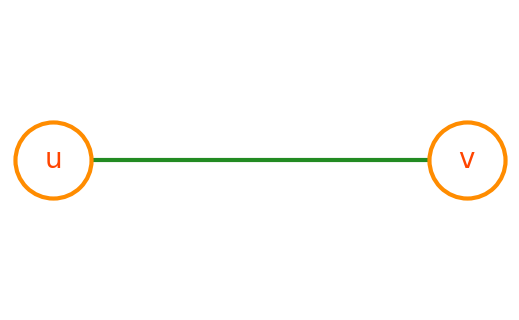

In [11]:
options = {
  "font_size": 20,
  "font_color": "orangered",
  "node_size": 3000,
  "edge_color": "forestgreen",
  "node_color": "white",
  "edgecolors": "darkorange",
  "linewidths": 3,
  "width": 3,
}

G_2_nodes = nx.Graph()
G_2_nodes.add_nodes_from(["u", "v"])
edges = [("u", "v")]
G_2_nodes.add_edges_from(edges)

pos_2_nodes = {"u": (0, 2), "v": (2, 2)}

plt.figure(figsize=(5, 3))
nx.draw(G_2_nodes, pos_2_nodes, with_labels=True, **options)
#plt.savefig('2_nodes_input.png', transparent=True)

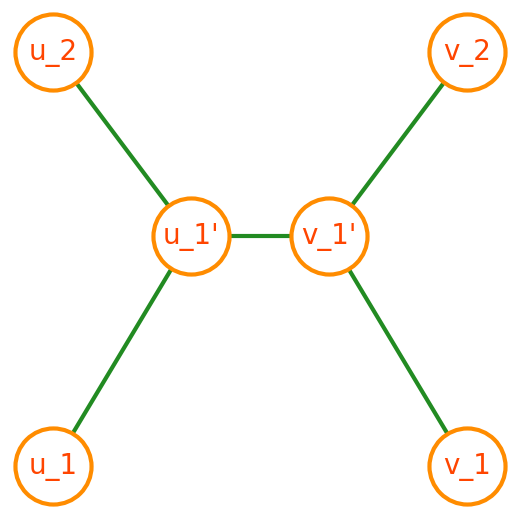

In [12]:

G_2_nodes_transformed, nodes_primes_2_nodes = transformed_graph(G_2_nodes)
pos_trans = dict()
pos_trans["u_1"] = (0,0)
pos_trans["u_2"] = (0, 9)
pos_trans["v_1"] = (9,0)
pos_trans["v_2"] = (9,9)
pos_trans["u_1'"] = (3,5)
pos_trans["v_1'"] = (6,5)
plt.figure(figsize=(5,5))
nx.draw(G_2_nodes_transformed, pos_trans, with_labels = True, **options)
#plt.savefig('2_nodes_transf_output.png', transparent=True)

#### Matching Algorithm for a Graph example

Resultant Graph with Matched edges 




[['u_1', "u_1'"], ['u_2', "u_2'"], ['v_1', "v_1'"], ['w_1', "w_2'"], ['x_1', "x_4'"], ['x_2', "x_5'"], ['w_2', "w_5'"], ["v_3'", "w_3'"], ['v_2', "v_4'"]]




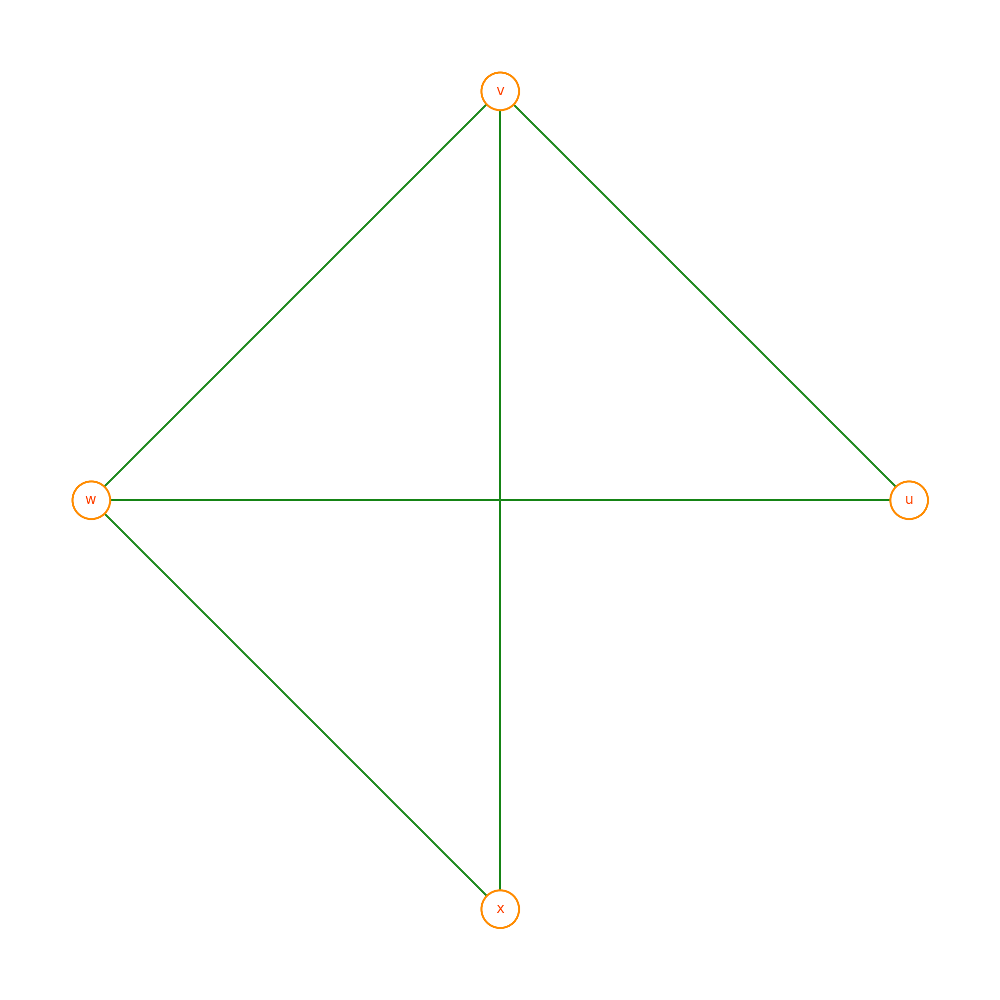

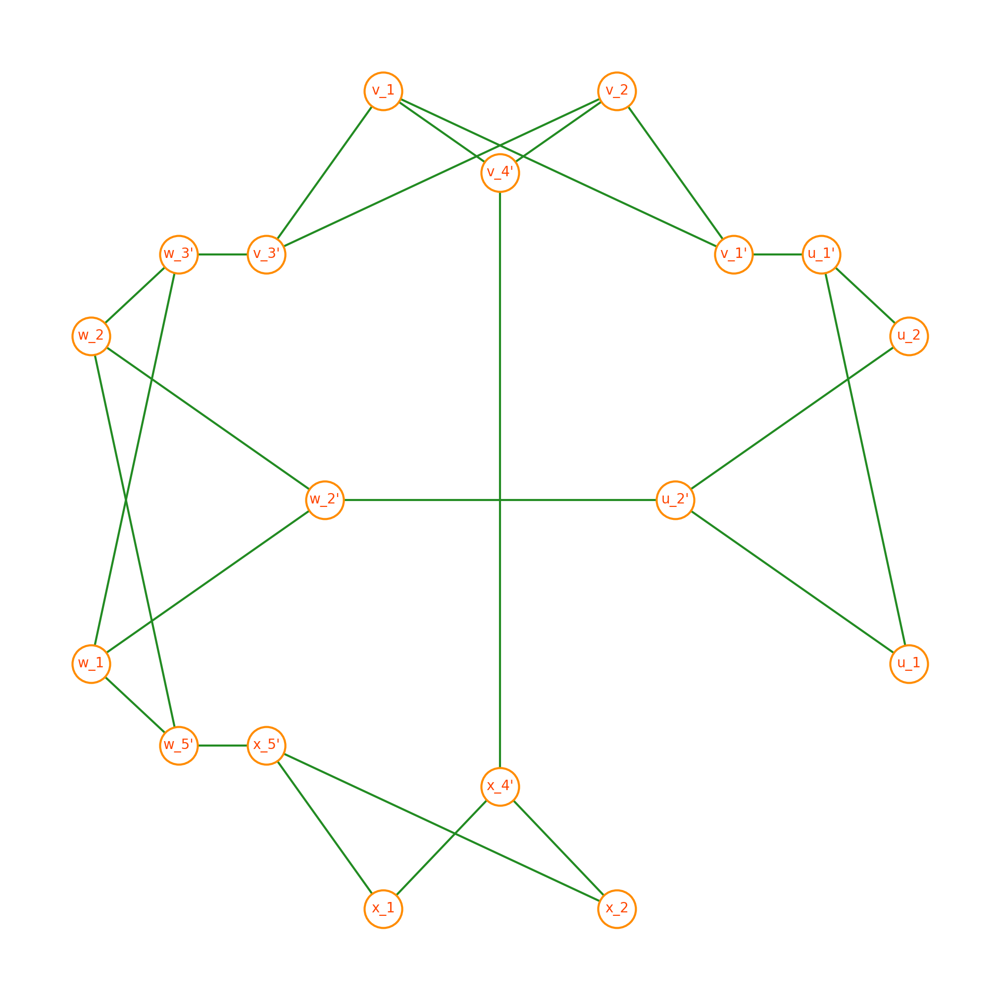

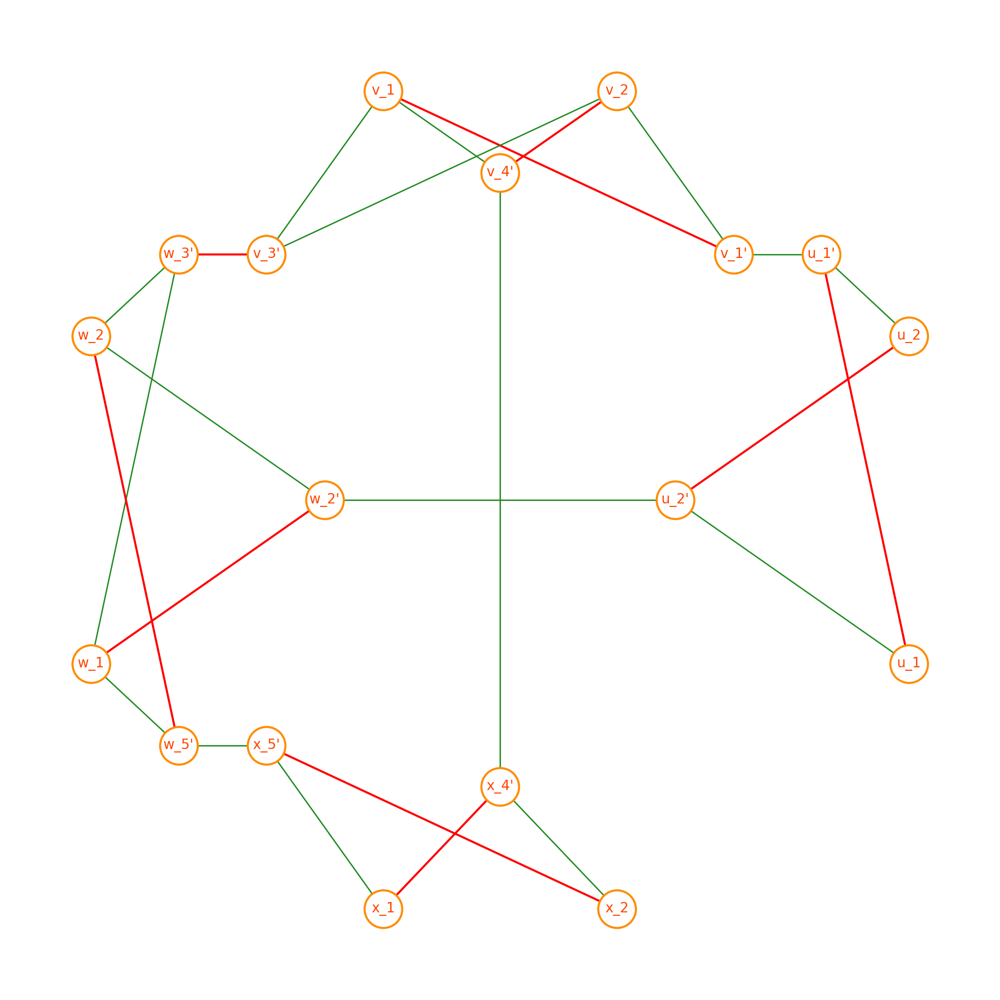

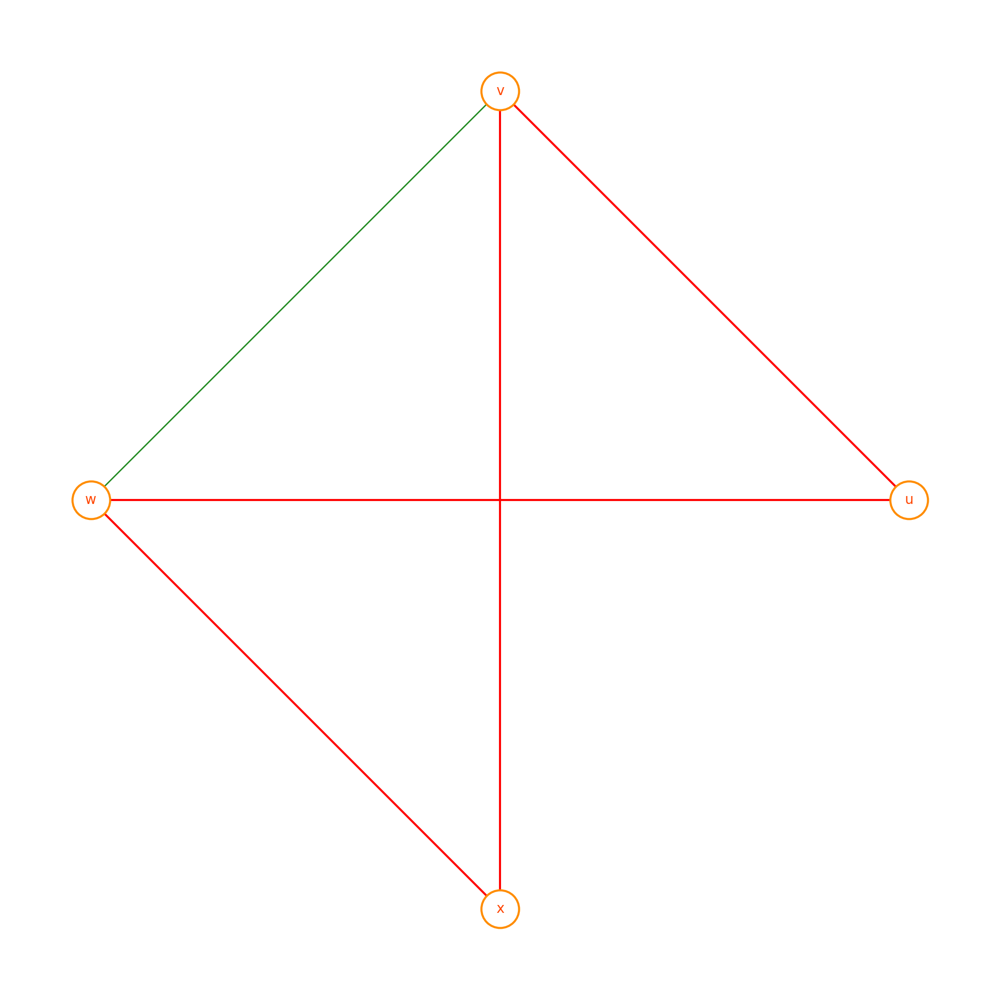

[('u', 'v'), ('u', 'w'), ('v', 'x'), ('w', 'x')]

In [20]:
options = {
    "font_size": 20,
    "font_color": "orangered",
    "node_size": 3000,
    "edge_color" : "forestgreen",
    "node_color": "white",
    "edgecolors": "darkorange",
    "linewidths": 3,
    "width": 3,
  }
G_4_nodes = nx.Graph()
G_4_nodes.add_nodes_from(["u","v","w","x"])
egdes = [("u", "v"), ("v", "w"),("w", "x"),("u", "w"),("v","x")]
G_4_nodes.add_edges_from(egdes)
plt.figure(figsize= (20,20))
pos_4 =  nx.circular_layout(G_4_nodes)
nx.draw(G_4_nodes, pos_4, with_labels = True, **options)
#plt.savefig("4_nodes", transparent= True)
plt.figure(figsize= (20,20))

G_4_nodes_transformed, nodes_primes_4_nodes = transformed_graph(G_4_nodes)
pos_4_nodes= dict()
pos_4_nodes["w_1"] = (0,6)
pos_4_nodes["w_2"] = (0,14)
pos_4_nodes["w_2'"] = (8,10)
pos_4_nodes["w_3'"] = (3,16)
pos_4_nodes["w_5'"] = (3,4)
pos_4_nodes["v_1"] = (10,20)
pos_4_nodes["v_2"] = (18,20)
pos_4_nodes["v_1'"] = (22,16)
pos_4_nodes["v_3'"] = (6,16)
pos_4_nodes["v_4'"] = (14,18)
pos_4_nodes["u_1"] = (28,6)
pos_4_nodes["u_2"] = (28,14)
pos_4_nodes["u_1'"] = (25,16)
pos_4_nodes["u_2'"] = (20,10)
pos_4_nodes["x_1"] = (10,0)
pos_4_nodes["x_2"] = (18,0)
pos_4_nodes["x_4'"] = (14,3)
pos_4_nodes["x_5'"] = (6,4)
nx.draw(G_4_nodes_transformed, pos_4_nodes, with_labels = True, **options)
#plt.savefig("4_nodes_transformed", transparent= True)
options = {
    "font_size": 20,
    "font_color": "orangered",
    "node_size": 3000,
    "node_color": "white",
    "edgecolors": "darkorange",
    "linewidths": 3,
  }
Gdash_4_nodes, matching_4_nodes = matching_edmonds(G_4_nodes_transformed, show = True, pos = pos_4_nodes, options = options, figsize = (20,20))
reconstitute_matching(G_4_nodes, nodes_primes_4_nodes, matching_4_nodes, pos_4, options = options,figsize = (20,20))

#### Within a Champion League Pot

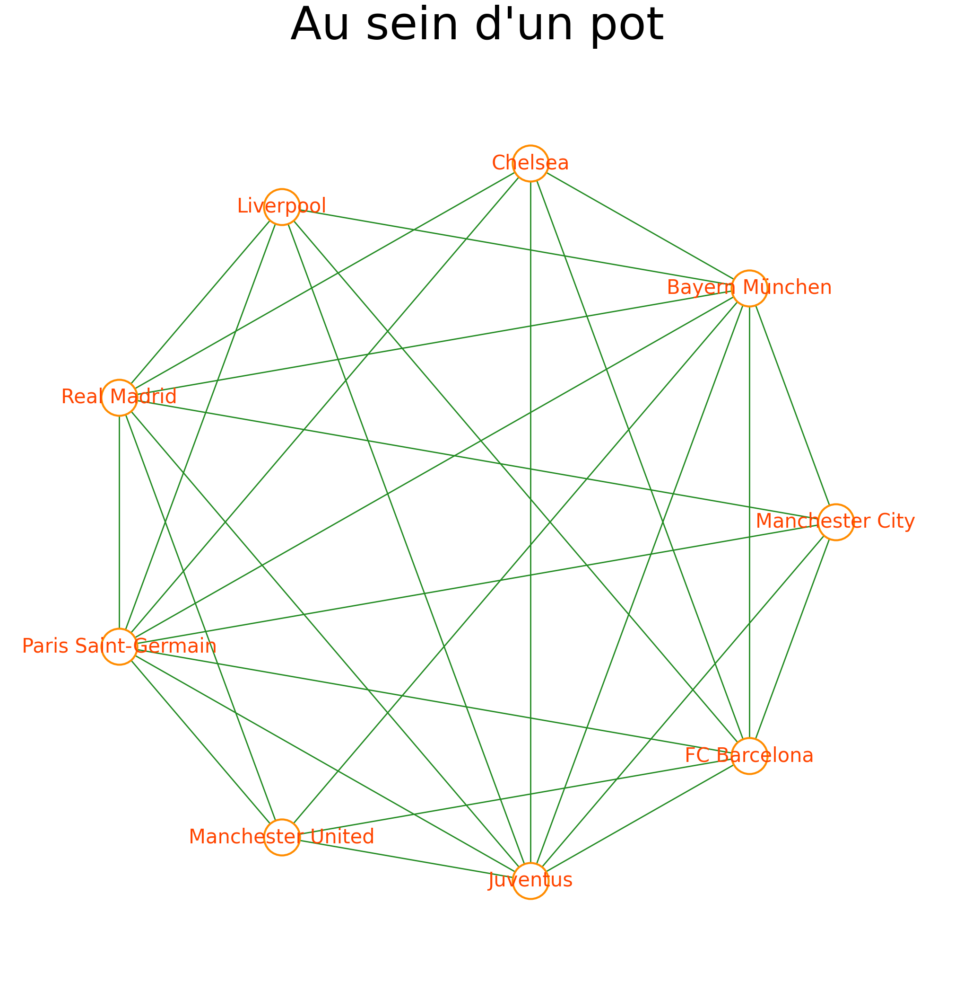

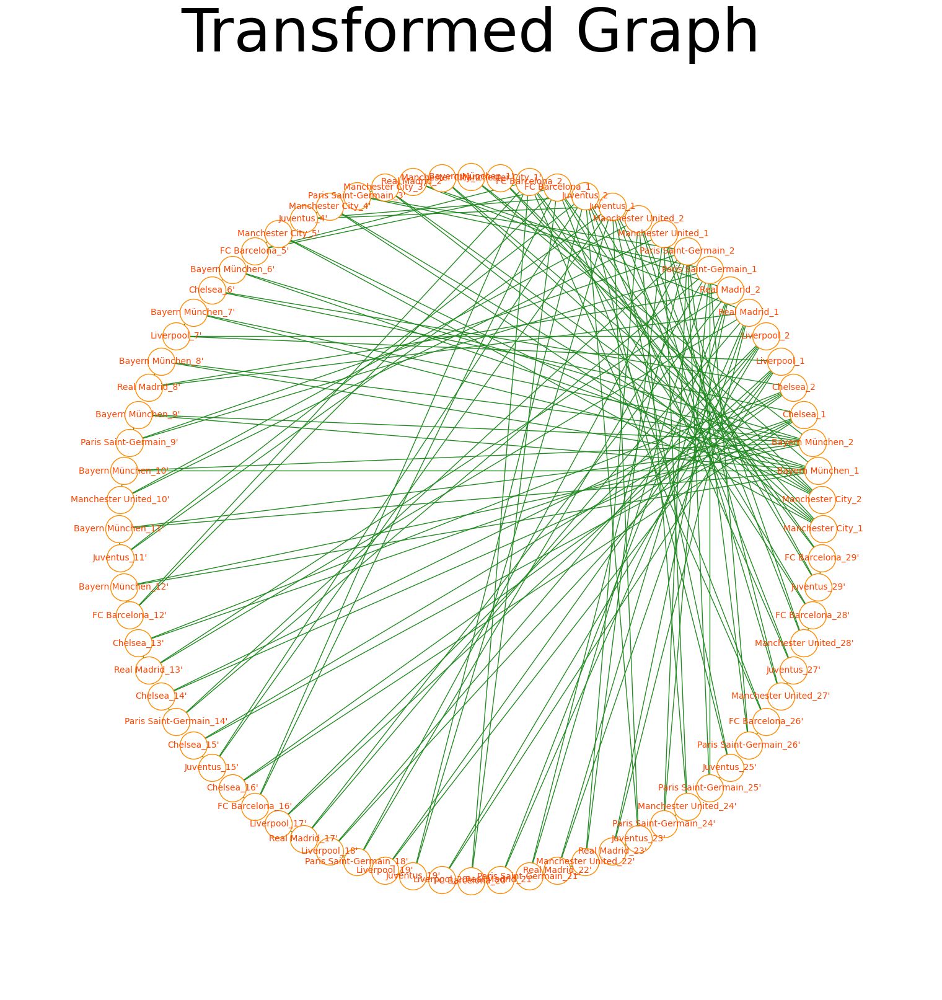

In [14]:
options = {
    "font_size": 10,
    "font_color": "orangered",
    "node_size": 1000,
    "edge_color" : "forestgreen",
    "node_color": "white",
    "edgecolors": "darkorange",
    "linewidths": 1,
    "width": 1,
  }

G = single_pot_graph(pots['A'], show = True)
G_transformed, nodes_primes_single_pot = transformed_graph(G, degree = 2, show = True, options=options)

## Résultats

### Illustration of the results within one pot

Resultant Graph with Matched edges 




[['Manchester City_1', "Manchester City_1'"], ['Manchester City_2', "Manchester City_2'"], ['Manchester City_3', "Manchester City_3'"], ['Manchester City_4', "Manchester City_4'"], ['Bayern München_1', "Bayern München_1'"], ['Bayern München_3', "Bayern München_7'"], ['Bayern München_4', "Bayern München_8'"], ['Chelsea_2', "Chelsea_13'"], ['Chelsea_3', "Chelsea_14'"], ['Chelsea_4', "Chelsea_15'"], ['Liverpool_1', "Liverpool_7'"], ['Liverpool_3', "Liverpool_18'"], ['Liverpool_4', "Liverpool_19'"], ['Real Madrid_1', "Real Madrid_2'"], ['Real Madrid_2', "Real Madrid_8'"], ['Real Madrid_3', "Real Madrid_13'"], ['Paris Saint-Germain_1', "Paris Saint-Germain_3'"], ['Paris Saint-Germain_3', "Paris Saint-Germain_14'"], ['Paris Saint-Germain_4', "Paris Saint-Germain_18'"], ['Manchester United_2', "Manchester United_22'"], ['Manchester United_3', "Manchester United_24'"], ['Manchester United_4', "Manchester United_27'"], ['Juventus_1', "Juventus_4'"], ['Juv

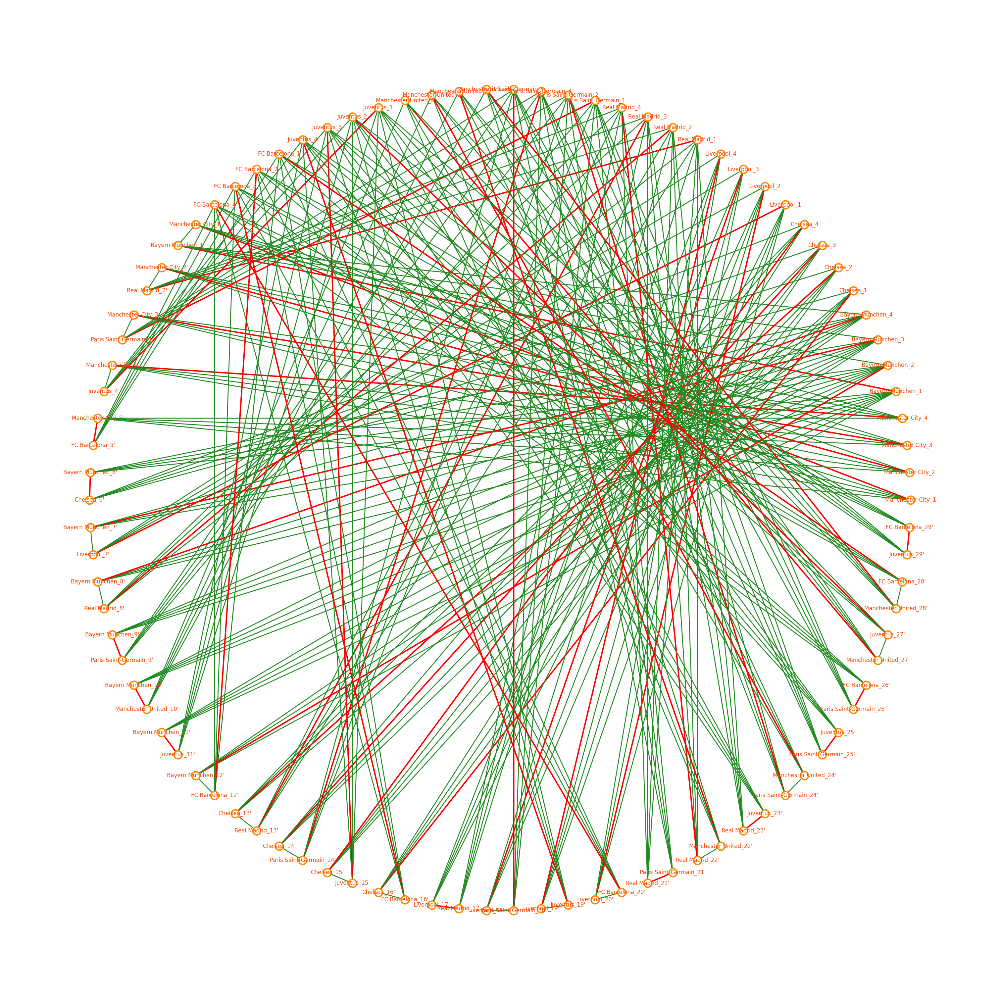

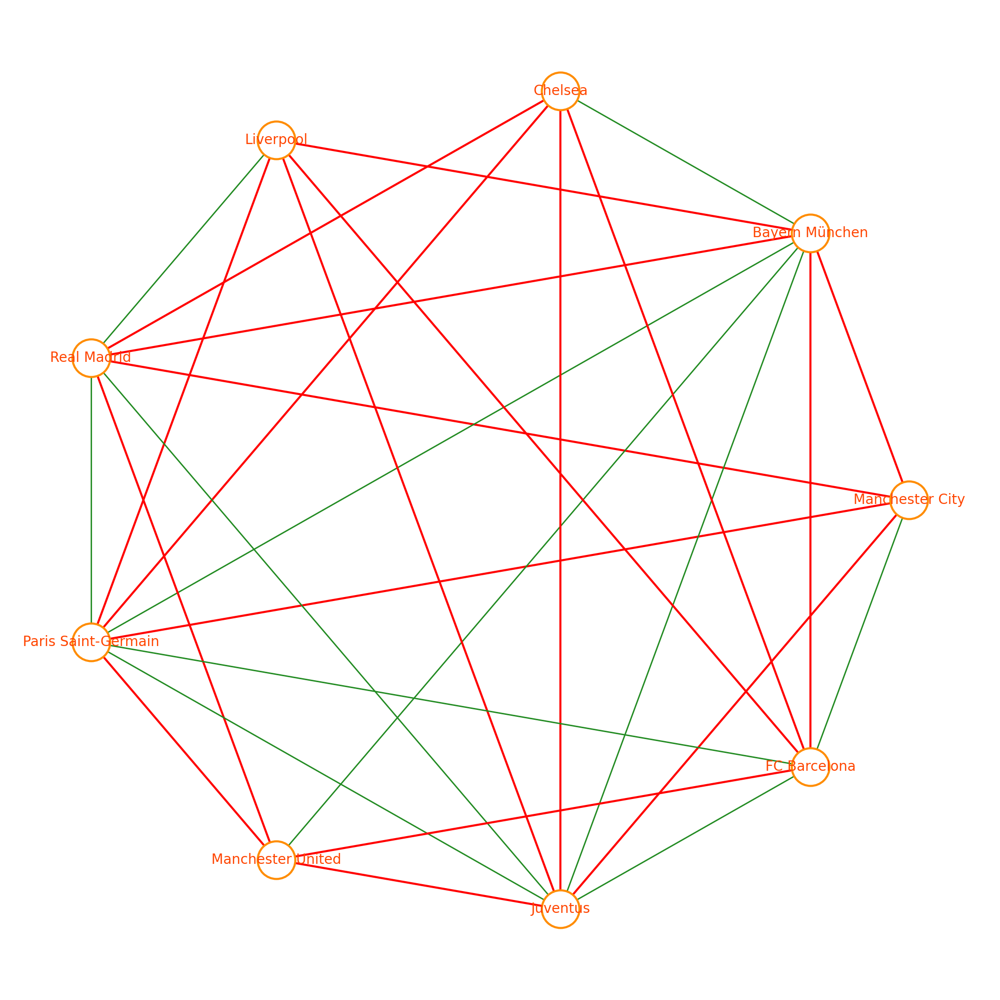

[('Manchester City', 'Bayern München'),
 ('Manchester City', 'Real Madrid'),
 ('Manchester City', 'Paris Saint-Germain'),
 ('Manchester City', 'Juventus'),
 ('Bayern München', 'Liverpool'),
 ('Bayern München', 'Real Madrid'),
 ('Bayern München', 'FC Barcelona'),
 ('Chelsea', 'Real Madrid'),
 ('Chelsea', 'Paris Saint-Germain'),
 ('Chelsea', 'Juventus'),
 ('Chelsea', 'FC Barcelona'),
 ('Liverpool', 'Paris Saint-Germain'),
 ('Liverpool', 'Juventus'),
 ('Liverpool', 'FC Barcelona'),
 ('Real Madrid', 'Manchester United'),
 ('Paris Saint-Germain', 'Manchester United'),
 ('Manchester United', 'Juventus'),
 ('Manchester United', 'FC Barcelona')]

In [15]:
degree = 4
G_pot = single_pot_graph(pots['A'], show = False)
G_pot_transformed, nodes_primes = transformed_graph(G_pot, degree=degree, show = False)
pos_single_pot_transformed = nx.circular_layout(G_pot_transformed)
Gdash_single_pot, matching_single_pot = matching_edmonds(G_pot_transformed, show = True, pos = pos_single_pot_transformed)
pos_single_pot = nx.circular_layout(G_pot)
options = {
    "font_size": 20,
    "font_color": "orangered",
    "node_size": 3000,
    "node_color": "white",
    "edgecolors":  "darkorange",
    "linewidths": 3,
  }
reconstitute_matching(G_pot, nodes_primes, matching_single_pot, pos_single_pot, d=degree, options = options,figsize = (20,20))

### Test

In [16]:
matching_existence_distinct_pots(pots, degree=2)  # call test_2 function with pots and default value of d=2

There exist a matching such ∀i!=j ∈ [1,..., k] ∀v ∈ (V_i U V_j) degF (v) = 2 .


True

# Conclusion



In [21]:
d = 2
k = len(pots)

print(f"We have a graph G = (V, E), where the vertices are partitioned into k subsets V1, ..., V_{k}.")
print()
print(f"We have an integer d = {d}. We want to decide if there exists a subset F of E such that every vertex has exactly {d} neighbors in each Vi.")
print()

if matching_existence_distinct_pots(pots, degree=d) and matching_existence_within_pots(pots, degree=d):
    print()
    print(f"There exists a subset F of E such that every vertex has exactly {d} neighbors in each Vi in the graph.")
    print()
else:
    print(f"There does not exist a subset F of E such that every vertex has exactly {d} neighbors in each Vi in the graph.")

We have a graph G = (V, E), where the vertices are partitioned into k subsets V1, ..., V_4.

We have an integer d = 2. We want to decide if there exists a subset F of E such that every vertex has exactly 2 neighbors in each Vi.

There exist a matching such ∀i!=j ∈ [1,..., k] ∀v ∈ (V_i U V_j) degF (v) = 2 .


There exist a perfect matching in each pot for d = 2.

There exists a subset F of E such that every vertex has exactly 2 neighbors in each Vi in the graph.



<div style="border: 2px solid #003D39; padding: 10px; background-color: #007D75; border-radius: 5px; color: #FFFFFF;">

**Remark:**

Here, we have fixed the value of `d` for the matching algorithms. However, it is possible to assign a specific number of neighbors in the matching for each team by using a `degree_dict`. The `degree_dict` can be defined to specify the desired degree for each team in the matching. This allows for more flexibility in the matching process and can be customized according to specific requirements or constraints.
It would be used in the draw process.

</div>